In [1]:
from anndata import read_h5ad
import pandas as pd
import numpy as np
import scvi
import scanpy as sc

%load_ext nb_black
use_cuda = True


In [2]:
import matplotlib.pyplot as plt

%matplotlib inline

In [3]:
data_path = "../TabulaSapiensData/"

In [4]:
adata = read_h5ad(data_path + "decontX/Pilot1_Pilot2.decontX.h5ad")

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9002. The TBB threading layer is disabled.
  warnings.warn(problem)
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


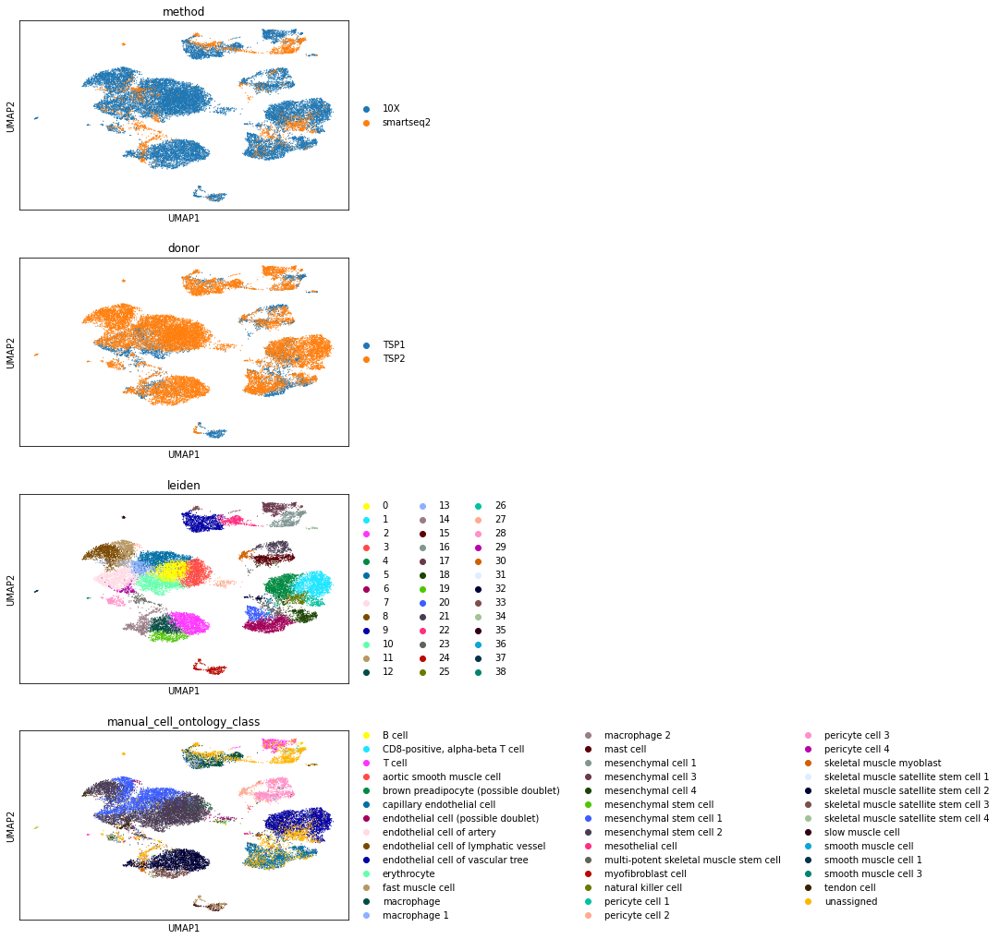

In [5]:
organ = "Muscle"
organ_adata = adata[adata.obs["tissue"] == organ]
sc.pp.neighbors(organ_adata, use_rep="X_scvi_decontX")
sc.tl.umap(organ_adata)
organ_adata.obsm["X_umap_decontX"] = organ_adata.obsm["X_umap"].copy()
sc.tl.leiden(organ_adata, resolution=2)
sc.pl.umap(
    organ_adata,
    color=["method", "donor", "leiden", "manual_cell_ontology_class"],
    ncols=1,
)
organ_adata.X = np.log1p(organ_adata.X)

# cluster to celltype correspondance
count is a matrix of cluster-cell type correspondance, where each row is a celltype, and each colum is a cluster. The entries to the matrix is the number of cells that is annotated as celltype *X* and cluster *Y*

In [6]:
count = {}
for c in np.unique(organ_adata.obs["leiden"]):
    count[c] = {}
    for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
        count[c][t] = np.sum(
            (organ_adata.obs["leiden"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )

count = pd.DataFrame.from_dict(count)

We can visualize the cluster assignment of each cell type through this heatmap. The color is normalized for each celltype 

<AxesSubplot:>

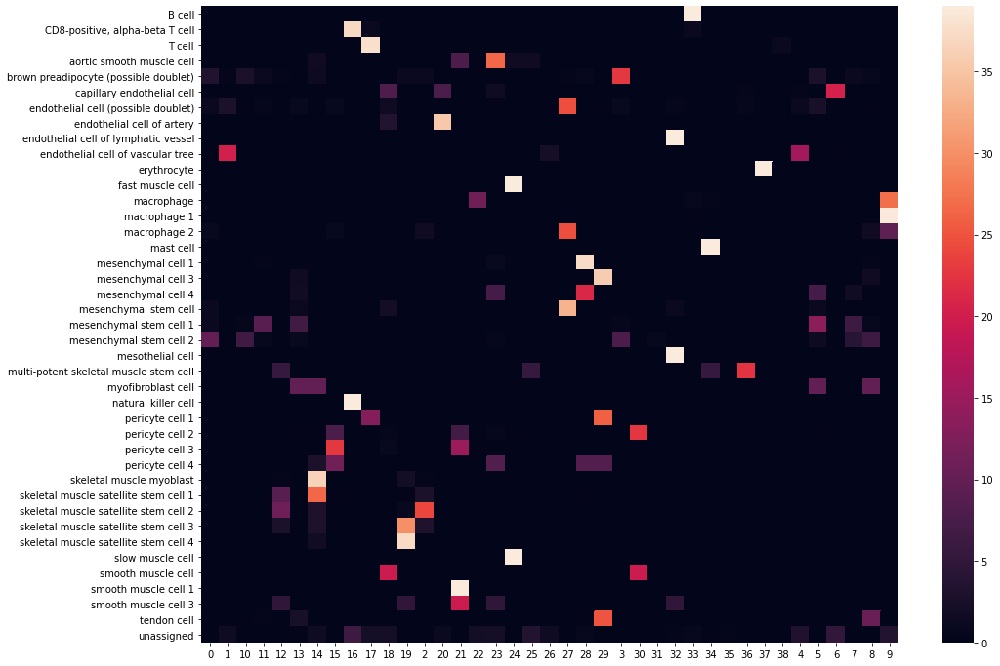

In [7]:
import seaborn

plt.figure(figsize=(16, 12))
seaborn.heatmap((count.T / count.mean(axis=1)).T)

# dictionary of cell type composition of each cluster 
What are clusters previously annotated as 

In [8]:
cluster_composition = {}
for x in count.columns.values:
    t = count.index[count[x] > 0].values
    freq = np.asarray([count.loc[y, x] for y in t]) / count[x].sum()
    res = [a + ": %.2f" % b for a, b in zip(t, freq)]
    cluster_composition[x] = res

In [9]:
cluster_composition["0"]

['brown preadipocyte (possible doublet): 0.01',
 'endothelial cell (possible doublet): 0.00',
 'macrophage 2: 0.00',
 'mesenchymal stem cell: 0.00',
 'mesenchymal stem cell 1: 0.05',
 'mesenchymal stem cell 2: 0.93',
 'unassigned: 0.01']

# Reassign pure clusters
If a cluster is very pure (>95% of annotated cells come from the same celltype, we reassign the clusters to all have the same labels) 

In [10]:
def Purity(x):
    names = x.index
    x = np.asarray(x).ravel()
    x = x[names != "unassigned"]
    return (np.max(x) / np.sum(x), names[np.argmax(x)])

In [11]:
cluster_purity = count.apply(Purity, axis=0).T
confident_clusters = cluster_purity[cluster_purity[0] > 0.95].index

<ipython-input-1-963029a66ab7>:5: RuntimeWarning: invalid value encountered in long_scalars
  return (np.max(x) / np.sum(x), names[np.argmax(x)])


In [12]:
for i in confident_clusters:
    organ_adata.obs.loc[
        organ_adata.obs["leiden"] == i, "new_manual_cell_ontology_class"
    ] = cluster_purity.loc[i, 1]

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'new_manual_cell_ontology_class' as categorical


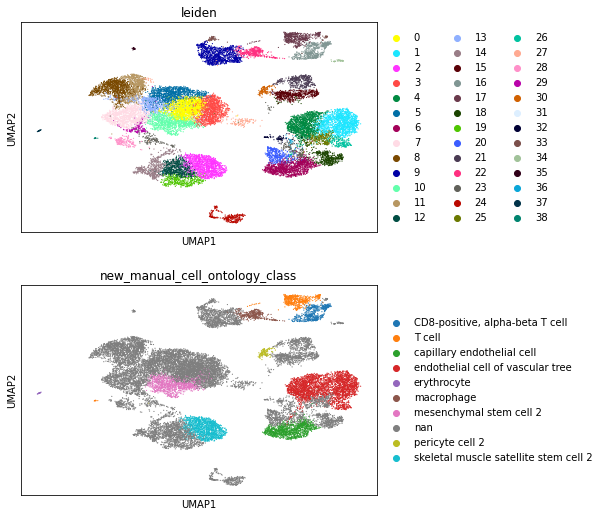

In [13]:
sc.pl.umap(
    organ_adata,
    color=["leiden", "new_manual_cell_ontology_class"],
    ncols=1,
)

# Sankey Diagram between cluster and cell types

In [14]:
from utils.colorDict import donor_colors, method_colors, compartment_colors, tissue_colors

In [15]:
from utils.plotting_utils import *
from utils.colorDict import compartment_colors

import plotly
import chart_studio.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import plotly.io as pio

pio.renderers.default = "notebook"

init_notebook_mode(connected=True)

In [16]:
df = pd.DataFrame(columns=["celltype", "compartment", "count"])
for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
    for c in np.unique(organ_adata.obs["compartment_pred_svm"]):
        x = np.sum(
            (organ_adata.obs["compartment_pred_svm"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )
        df = df.append(
            pd.DataFrame([t, c, x], index=["celltype", "compartment", "count"]).T,
            ignore_index=True,
        )


fig = genSankey(
    df,
    cat_cols_color=[compartment_colors(), "#00A1E0"],
    cat_cols=["compartment", "celltype"],
    value_cols="count",
    title="celltype-compartment",
)
iplot(fig, validate=False)
plotly.offline.plot(
    fig, validate=False, filename="figures/celltype_sankey_%s" % organ + ".html"
)  # , output_type='div')

'figures/celltype_sankey_Muscle.html'

# visualize compartment markers

In [17]:
compartment_markers = {
    "Epithelial": ["CDH1", "CLDN4", "EPCAM"],
    "Endothelial": ["CA4", "CDH5", "CLDN5", "PECAM1", "VWF"],
    "Stromal": ["BGN", "DCN", "COL1A2"],
    "Immune": ["LCP1", "PTPRC", "RAC2"],
}

In [18]:
for x in compartment_markers.keys():
    sc.tl.score_genes(organ_adata, compartment_markers[x], score_name="%s_score" % x)

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



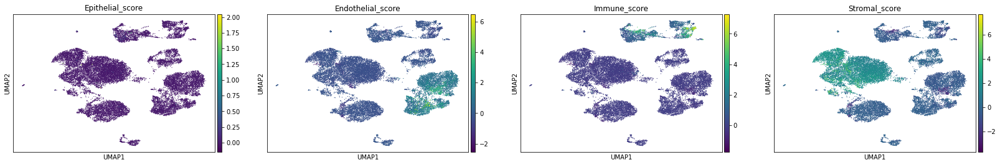

In [19]:
sc.pl.umap(
    organ_adata,
    color=["Epithelial_score", "Endothelial_score", "Immune_score", "Stromal_score"],
)

# Find markers for each cluster

In [20]:
sc.tl.rank_genes_groups(organ_adata, groupby="leiden", method="wilcoxon")

In [21]:
def FormatDE(res):
    groups = res['scores'].dtype.names
    df_res = {}
    for group in groups:
        df = pd.DataFrame([res['scores'][group],
                           res['logfoldchanges'][group],res['pvals_adj'][group]], 
                           columns=res['names'][group],
                           index=['wilcoxon_score','log fold change','adjusted pvalue'])
        df_res[group] = df
    return df_res


In [22]:
DE = FormatDE(organ_adata.uns["rank_genes_groups"])

### top positive marker genes

In [23]:
for x in DE.keys():
    print(x)
    display(DE[x].T[:20])

0


,wilcoxon_score,log fold change,adjusted pvalue
SMOC2,46.335026,2.893735,0.0
LTBP2,46.200565,2.803072,0.0
APOD,45.640312,4.266783,0.0
COL4A1,45.540333,2.758496,0.0
NID1,45.539928,2.896186,0.0
LAMA2,44.994942,2.785255,0.0
LAMB1,44.960964,2.562249,0.0
COL6A3,44.944424,3.524861,0.0
GFRA1,44.703705,2.462728,0.0
COL4A2,44.032066,2.324510,0.0


1


,wilcoxon_score,log fold change,adjusted pvalue
ACKR1,54.221554,5.455943,0.0
ADAMTS9,53.254658,4.590314,0.0
PLVAP,53.081215,4.308427,0.0
SELE,52.243813,5.652627,0.0
VWF,51.372997,4.091825,0.0
CNKSR3,50.975651,4.291377,0.0
CD93,50.505764,3.711186,0.0
AQP1,50.501534,4.058447,0.0
PECAM1,50.016174,3.556271,0.0
TM4SF1,48.850597,4.131559,0.0


2


,wilcoxon_score,log fold change,adjusted pvalue
TNFRSF12A,49.126751,3.409384,0.000000e+00
WEE1,45.399021,3.236706,0.000000e+00
GREM1,44.849270,5.704813,0.000000e+00
PPP1R14C,43.218075,4.891705,0.000000e+00
MEG3,40.993629,2.628448,0.000000e+00
ADPRHL1,40.153553,5.183822,0.000000e+00
MAT2A,40.141457,1.931458,0.000000e+00
CRYAB,39.297016,2.527433,0.000000e+00
METRNL,38.912449,2.332208,0.000000e+00
CADM2,38.506664,3.858977,0.000000e+00


3


,wilcoxon_score,log fold change,adjusted pvalue
LAMA2,45.379372,3.143611,0.0
LTBP2,44.920582,3.170688,0.0
MEDAG,44.794506,3.032616,0.0
COL4A1,44.726307,3.109499,0.0
COL6A3,44.634762,3.818653,0.0
NID1,43.242855,3.064134,0.0
SMOC2,43.109325,3.121286,0.0
EGFR,43.070992,2.509691,0.0
LAMC1,42.901245,2.576792,0.0
COL12A1,42.839676,2.708032,0.0


4


,wilcoxon_score,log fold change,adjusted pvalue
ACKR1,53.257870,5.859460,0.0
PLVAP,52.437157,4.602846,0.0
TM4SF1,52.436420,5.194210,0.0
PLAT,51.813210,4.524801,0.0
IL6,51.321636,5.427081,0.0
AQP1,51.165520,4.640067,0.0
HLA-DRA,51.081814,4.497828,0.0
ADIRF,50.632526,4.352731,0.0
C2CD4B,50.588326,4.649364,0.0
SELE,50.573147,5.946553,0.0


5


,wilcoxon_score,log fold change,adjusted pvalue
NOVA1,38.110847,2.536742,0.000000e+00
MGST1,38.073338,2.578260,0.000000e+00
PLA2G2A,37.682228,4.003325,0.000000e+00
GPX3,37.171101,2.876041,2.943727e-298
SPOCK1,37.008568,2.519298,9.817197e-296
MT1X,36.641701,2.578673,6.086710e-290
APOD,36.271942,3.854705,3.768954e-284
NEGR1,35.816097,2.322747,4.564787e-277
AOX1,35.517040,2.314736,1.754674e-272
C1S,35.240021,2.390982,2.872093e-268


6


,wilcoxon_score,log fold change,adjusted pvalue
FABP4,49.577393,5.438119,0.0
BTNL9,49.465591,5.712372,0.0
ADGRF5,49.117550,4.620166,0.0
CD36,47.084778,4.292889,0.0
SLC9A3R2,46.585171,4.296881,0.0
ANXA3,45.272583,4.669455,0.0
RGCC,45.256496,4.042487,0.0
FABP5,44.655403,3.950025,0.0
F8,44.652546,3.958657,0.0
FLT1,40.886715,3.303641,0.0


7


,wilcoxon_score,log fold change,adjusted pvalue
ADH1B,34.582970,3.267081,2.438302e-258
NOVA1,33.813568,2.566842,5.239963e-247
ABCA6,32.871338,2.580464,2.215875e-233
APOD,32.296455,3.900004,2.716235e-225
ABCA8,31.015589,2.463186,1.086661e-207
DCN,30.273775,4.335402,7.472976e-198
CFD,29.241852,3.594101,1.597977e-184
MGST1,28.809530,2.332618,3.837104e-179
TXNIP,28.532139,1.769275,9.839053e-176
IGFBP6,27.870483,2.459290,1.193663e-167


8


,wilcoxon_score,log fold change,adjusted pvalue
FBLN1,40.453762,2.977476,0.000000e+00
IGF1,39.948627,3.697974,0.000000e+00
SPOCK1,39.402786,2.883953,0.000000e+00
COL1A2,37.966625,2.850554,0.000000e+00
LUM,37.215904,2.696748,4.444196e-299
COL3A1,36.864872,2.761344,1.658061e-293
NID1,36.439709,2.843491,8.420310e-287
COL6A3,36.396294,3.485134,3.585315e-286
COL6A1,36.242092,2.710338,8.658810e-284
ELN,35.334805,3.135007,1.010247e-269


9


,wilcoxon_score,log fold change,adjusted pvalue
CD163,52.417061,8.958509,0.0
MRC1,51.115192,9.148968,0.0
C1QA,50.970837,9.168604,0.0
MS4A6A,50.384888,8.089849,0.0
C1QB,50.069332,9.292709,0.0
VSIG4,49.069366,8.499170,0.0
CTSB,48.873890,5.524374,0.0
LAPTM5,48.728123,6.038920,0.0
FCER1G,48.713577,7.010495,0.0
TYROBP,48.615643,6.809997,0.0


10


,wilcoxon_score,log fold change,adjusted pvalue
SMOC2,44.567501,4.622829,0.0
COL6A2,43.209164,3.866184,0.0
COL6A1,42.130325,3.740172,0.0
DCN,42.055748,5.584021,0.0
CFD,41.920109,5.346482,0.0
FBLN2,41.433369,3.696752,0.0
PDGFRL,41.303673,3.983443,0.0
LTBP4,41.209187,3.893628,0.0
GSN,40.845615,4.137555,0.0
COL1A2,40.563110,3.737850,0.0


11


,wilcoxon_score,log fold change,adjusted pvalue
C7,34.919106,5.002879,2.245003e-262
PODN,32.054794,2.975551,5.540686e-221
PLA2G2A,30.581318,4.167230,4.255931e-201
EFEMP1,29.729500,2.739685,4.698791e-190
SERPINF1,29.615721,2.676667,1.104011e-188
PCOLCE,29.574635,2.617881,3.107991e-188
COL1A2,28.805429,2.701192,1.542497e-178
COL14A1,28.673140,3.583693,5.435286e-177
SPOCK1,28.672899,2.667775,5.435286e-177
C1R,28.306801,2.666388,1.677858e-172


12


,wilcoxon_score,log fold change,adjusted pvalue
WEE1,32.357742,3.017505,3.177887e-225
APOE,27.376709,2.610954,4.368668e-161
GREM1,26.408375,4.022873,7.182271e-150
CADM2,25.717005,3.370011,4.441357e-142
GPM6B,25.634464,2.660988,3.372138e-141
MEG3,25.212515,2.157377,1.228087e-136
CRYAB,25.122715,2.128739,1.102397e-135
APOC1,23.560587,2.741993,3.125020e-119
KLHL41,23.443556,3.030411,4.526909e-118
DLK1,23.093487,3.105194,1.377823e-114


13


,wilcoxon_score,log fold change,adjusted pvalue
MGP,31.559914,5.310741,7.718007e-214
CFD,31.300072,6.112933,1.370443e-210
APOD,31.210545,6.851716,1.503977e-209
C1S,30.981405,5.665715,1.412505e-206
FBLN1,29.400660,5.132838,6.341507e-186
EGR1,29.258152,3.616961,3.469872e-184
EFEMP1,29.156153,5.698143,5.870808e-183
C1R,29.077566,4.785197,5.077380e-182
GSN,28.972843,4.736691,9.465158e-181
SERPINF1,28.948732,5.506432,1.713884e-180


14


,wilcoxon_score,log fold change,adjusted pvalue
CXCL14,27.813454,4.371790,5.852555e-166
MYF5,27.182167,6.405831,1.553350e-158
PON2,26.938786,5.117832,9.089437e-156
DLK1,26.749523,6.547154,1.227068e-153
GPM6B,25.926762,5.310930,2.796556e-144
APOE,25.238865,4.725814,9.817218e-137
MT-CO3,24.941698,2.686766,1.546836e-133
MEG3,24.563461,4.133321,1.662199e-129
CHRNA1,23.334438,6.956742,9.728540e-117
APOC1,22.783253,4.933559,2.637773e-111


15


,wilcoxon_score,log fold change,adjusted pvalue
NOTCH3,34.205181,4.760943,1.192103e-251
RGS5,33.993774,6.132336,8.104957e-249
ACTA2,33.954693,5.484928,2.040659e-248
MYL9,32.000740,3.461499,1.253723e-220
GJA4,30.500000,5.607048,2.556803e-200
ABCC9,29.935804,4.190610,5.663008e-193
ADAMTS4,29.448683,3.701665,8.561249e-187
CPE,28.988707,3.474695,5.376142e-181
STEAP4,28.354591,3.411084,3.604395e-173
NDUFA4L2,28.056885,5.183590,1.490800e-169


16


,wilcoxon_score,log fold change,adjusted pvalue
CXCR4,35.249897,10.665095,1.013577e-267
B2M,34.579689,6.638417,1.001549e-257
RPS27,32.358139,4.586615,1.045778e-225
TMSB4X,31.947971,6.214799,4.241950e-220
ARHGDIB,31.925020,9.213334,7.853610e-220
MALAT1,30.986198,4.697446,4.426972e-207
SRGN,30.970222,7.328760,6.659865e-207
PTPRC,30.850986,8.106050,2.460583e-205
TMSB4XP8,30.645000,7.190390,1.133501e-202
MT-CO1,30.624971,4.867639,1.971846e-202


17


,wilcoxon_score,log fold change,adjusted pvalue
CXCR4,35.194878,4.521589,5.496961e-267
PTPRC,35.190430,4.667666,5.496961e-267
CNOT6L,33.442184,3.589674,2.593503e-241
STK4,32.218670,3.485837,5.691411e-224
PPP2R5C,29.478079,2.542314,1.703833e-187
ARL4C,28.626040,3.803545,6.253129e-177
IL7R,28.313623,5.851617,3.737297e-173
SMCHD1,28.310535,2.737730,3.971834e-173
SRGN,28.220819,3.042217,4.902420e-172
SYTL3,27.350691,4.630841,1.199675e-161


18


,wilcoxon_score,log fold change,adjusted pvalue
RGS5,34.796787,7.190331,1.601290e-260
ADGRF5,33.223370,4.801749,1.457263e-237
SLC9A3R2,33.117798,5.021785,3.233516e-236
NDUFA4L2,32.915344,5.963035,1.951443e-233
TINAGL1,32.713299,4.189691,1.189766e-230
PPP1R14A,32.393967,4.748693,3.275031e-226
FABP4,32.211720,5.533990,1.017301e-223
CD36,31.777527,4.633558,9.737890e-218
MYL9,31.573492,3.653753,5.583812e-215
FABP5,30.697441,4.273557,3.624776e-203


19


,wilcoxon_score,log fold change,adjusted pvalue
MYF5,26.718088,4.598424,8.540479e-153
H19,24.953224,3.342963,2.899403e-133
TNFRSF12A,24.384319,2.760291,2.461309e-127
GPM6B,23.889891,3.503509,2.870850e-122
APOE,23.342558,3.051701,9.655792e-117
PPP1R14B,21.934896,2.306377,5.921851e-103
ASB5,21.012991,4.030643,2.259347e-94
DLK1,20.989420,3.845890,3.445592e-94
RUNX1,20.962309,2.234535,5.686333e-94
CRYAB,20.812784,2.202488,1.219797e-92


20


,wilcoxon_score,log fold change,adjusted pvalue
SLC9A3R2,27.367260,4.187732,3.962094e-160
PODXL,26.882059,4.050862,1.047980e-154
EPAS1,25.505316,3.044805,3.377059e-139
TM4SF1,24.875650,3.859204,2.009240e-132
PIK3R3,24.067894,3.542086,6.385780e-124
SRGN,24.048862,3.120555,7.724563e-124
ANXA3,24.046032,3.539474,7.724563e-124
IFI27,23.898726,3.088184,2.323667e-122
PECAM1,23.460518,3.014956,6.077897e-118
A2M,23.102495,2.908732,2.338808e-114


21


,wilcoxon_score,log fold change,adjusted pvalue
MYH11,32.626720,9.764874,1.009222e-228
MYL9,31.781599,5.428892,3.421957e-217
ACTA2,31.523129,7.607156,8.218121e-214
TAGLN,31.332832,6.053888,2.453666e-211
TPM2,30.843321,5.634909,8.105902e-205
AP002956.1,30.359795,5.423046,1.830574e-198
RERGL,29.497400,10.578166,2.614458e-187
NOTCH3,29.211269,4.897151,1.026416e-183
CASQ2,28.749935,7.999531,5.935837e-178
LMOD1,28.686869,5.288478,3.275226e-177


22


,wilcoxon_score,log fold change,adjusted pvalue
S100A9,32.010437,8.428092,4.595018e-220
S100A8,31.041996,8.412817,4.306472e-207
LYZ,30.607197,8.061696,1.926542e-201
CTSS,30.230759,6.080700,1.374856e-196
IL1B,30.102648,8.983884,5.267509e-195
C5AR1,30.011742,6.337724,6.766763e-194
BCL2A1,29.954329,6.988556,3.249984e-193
FCER1G,29.374550,6.201302,8.544807e-186
SRGN,29.248714,5.730953,3.049887e-184
SAMSN1,29.200411,6.344029,1.128005e-183


23


,wilcoxon_score,log fold change,adjusted pvalue
MT-RNR2,17.543734,2.653407,7.109024e-66
MTRNR2L12,14.856690,3.182819,1.881424e-47
MT-ATP8,14.227485,3.368206,1.379592e-43
MTRNR2L8,13.202031,3.076797,1.358800e-37
MTCO2P12,12.319839,3.160567,8.290481e-33
TMSB4XP8,11.991156,3.302111,4.097589e-31
MTCO2P2,11.688692,3.427631,1.364992e-29
MT-RNR1,11.650848,1.888438,2.102902e-29
AC005912.1,11.120156,2.720139,7.909624e-27
TMSB4XP4,10.724672,2.515459,5.549817e-25


24


,wilcoxon_score,log fold change,adjusted pvalue
ACTA1,28.935299,11.379276,2.529434e-179
MB,28.879686,10.163712,6.324343e-179
DES,28.804140,8.220065,3.735512e-178
MYBPC1,28.782141,9.378834,5.282518e-178
CKM,28.650528,10.981771,1.859037e-176
ENO3,28.449423,10.557336,4.860431e-174
TCAP,28.352943,9.732268,6.475023e-173
COX6A2,27.907501,9.171074,1.055669e-167
MYL1,27.904831,11.268962,1.055669e-167
CA3,27.893986,8.339903,1.327183e-167


25


,wilcoxon_score,log fold change,adjusted pvalue
CD74,28.286402,12.275368,2.990628e-171
TM4SF1,28.138712,11.054440,9.695559e-170
IFI27,27.659592,8.728295,3.627889e-164
CD59,27.654484,8.306747,3.627889e-164
TMSB10,27.403744,6.864350,2.913767e-161
HLA-DRA,27.319748,9.404586,2.425184e-160
A2M,27.308935,10.228816,2.793969e-160
IFITM3,27.251120,7.432305,1.186103e-159
TMSB4X,27.230330,7.730303,1.858887e-159
NFKBIA,27.218285,9.574759,2.323290e-159


26


,wilcoxon_score,log fold change,adjusted pvalue
ACKR1,20.279781,5.250907,1.142013e-86
PLVAP,17.004095,3.886638,9.016240e-61
AQP1,16.927694,3.703205,2.758818e-60
PECAM1,16.862452,3.499084,7.147712e-60
CD74,16.026529,3.962139,6.138102e-54
RAMP3,15.387353,3.675990,7.810378e-50
VWF,15.293515,3.252645,3.107785e-49
MT-RNR2,15.110092,1.867510,4.544300e-48
NPDC1,15.044440,2.724662,1.105276e-47
IFI27,14.324379,2.771522,3.023956e-43


27


,wilcoxon_score,log fold change,adjusted pvalue
ABL2,9.563651,1.296064,6.691985e-18
VCAN,8.682837,1.139740,1.893739e-14
MAN1A1,8.334589,1.014153,3.521701e-13
HSPA1B,8.173249,1.319302,1.262316e-12
GASK1B,8.011550,0.983251,4.167694e-12
METTL7A,7.944595,0.857044,6.371908e-12
GAS6,7.909745,1.003808,7.991324e-12
HSPA1A,7.883429,1.517162,9.375589e-12
SAMHD1,7.675838,0.888138,4.606996e-11
EMP1,7.647219,0.940868,5.495564e-11


28


,wilcoxon_score,log fold change,adjusted pvalue
SFRP2,9.781294,4.332814,2.039630e-20
PLA2G2A,9.071877,3.385353,1.391281e-17
CCDC80,9.053245,2.674615,1.637298e-17
IGFBP6,8.707067,2.607161,3.313681e-16
RARRES1,8.409887,3.704126,3.947813e-15
TIMP1,8.228647,2.121936,1.720131e-14
MGP,7.639895,2.340193,1.599785e-12
IGFBP4,7.479982,2.205901,5.154257e-12
SERPINF1,7.276248,2.492171,2.210743e-11
MT-RNR2,7.206691,1.338299,3.613373e-11


29


,wilcoxon_score,log fold change,adjusted pvalue
CD9,16.594193,4.100093,2.259718e-57
PRELP,14.690573,3.984171,8.722824e-45
FMOD,13.938314,4.728847,3.636105e-40
RARRES1,13.653932,5.261009,1.608614e-38
PTN,13.010144,4.914337,6.307275e-35
THBS4,12.821925,4.788708,6.614484e-34
TNMD,12.772573,8.283176,1.144591e-33
ASPN,12.600286,5.769072,8.846450e-33
MXRA8,12.567795,3.111628,1.245913e-32
AEBP1,12.037651,3.489450,6.315333e-30


30


,wilcoxon_score,log fold change,adjusted pvalue
RGS5,17.626678,7.091668,9.050526e-65
NOTCH3,15.706274,4.617800,1.344173e-51
NDUFA4L2,15.469727,5.977873,4.087223e-50
ACTA2,14.954138,5.222528,7.833138e-47
PDGFRB,14.090730,3.588834,1.062267e-41
MYL9,13.994927,3.288296,3.519578e-41
STEAP4,13.932384,3.748311,7.647109e-41
ABCC9,13.784373,4.395101,5.480148e-40
CD36,13.226055,3.938869,7.360627e-37
CARMN,12.951364,6.280830,2.383906e-35


31


,wilcoxon_score,log fold change,adjusted pvalue
COL6A3,14.851521,4.685278,4.003660e-45
COL6A2,14.441813,3.772698,8.310019e-43
LTBP2,14.318462,3.869128,2.626852e-42
COL4A2,14.303959,3.404061,2.626852e-42
COL6A1,14.298647,3.721334,2.626852e-42
COL4A1,14.170846,3.733246,1.362029e-41
COL1A2,14.060658,3.877304,4.912501e-41
SMOC2,14.060137,3.950808,4.912501e-41
COL3A1,14.042843,4.220982,5.574613e-41
COL5A2,14.003627,3.570805,8.719558e-41


32


,wilcoxon_score,log fold change,adjusted pvalue
PKHD1L1,10.278770,9.012178,1.723730e-20
PROX1,10.109813,5.181448,5.884608e-20
MMRN1,9.886662,6.361805,4.666637e-19
PPFIBP1,9.500977,2.868532,1.748703e-17
CD9,9.016031,2.554361,1.148118e-15
TFF3,8.846761,7.577629,4.821770e-15
NR2F1,8.316142,4.903967,3.779378e-13
TSPAN5,8.283075,5.459701,4.156720e-13
ARL4A,8.242556,2.587940,5.513200e-13
DSP,8.087659,6.046851,1.676694e-12


33


,wilcoxon_score,log fold change,adjusted pvalue
LAPTM5,12.588334,5.596415,2.401734e-32
CD74,10.936567,5.224123,1.680256e-24
C1QA,9.046819,6.582794,6.932236e-17
C1QB,8.899233,6.659405,2.437234e-16
C1QC,8.806331,6.330288,5.214013e-16
HLA-DRA,8.570166,3.728821,3.755184e-15
TYROBP,8.453143,5.487979,9.593913e-15
FCER1G,8.060943,5.564683,2.025890e-13
CTSS,7.824605,4.000287,1.243973e-12
F13A1,7.782132,6.164150,1.679261e-12


34


,wilcoxon_score,log fold change,adjusted pvalue
TPSAB1,10.386646,18.318958,8.397285e-21
TPSB2,10.386621,17.996002,8.397285e-21
CPA3,10.103210,14.257554,1.049114e-19
CTSG,9.543738,16.437294,1.622159e-17
KIT,9.239610,10.069221,2.427396e-16
SRGN,8.143824,4.701972,2.505166e-12
HPGDS,8.085932,9.820743,3.631745e-12
GPR65,7.700045,7.322204,5.004634e-11
HDC,7.578159,14.905220,1.213731e-10
VWA5A,7.456685,6.265488,2.487295e-10


35


,wilcoxon_score,log fold change,adjusted pvalue
AL512646.1,9.051789,6.439126,1.655944e-15
SNHG14,3.171751,2.757018,5.860798e-02
ADGRV1,2.876138,8.761625,1.334433e-01
RTTN,2.596121,4.570894,2.690465e-01
AL157895.1,2.565470,9.553773,2.877480e-01
PWRN1,2.562457,9.969331,2.897076e-01
SATB1-AS1,2.539730,7.418410,3.053247e-01
FRG1DP,2.510226,6.789567,3.264881e-01
TSGA10,2.386653,5.259397,4.319982e-01
IKZF2,2.259552,4.458646,5.649885e-01


36


,wilcoxon_score,log fold change,adjusted pvalue
ANXA3,6.645010,2.963928,0.000002
ADGRF5,6.322109,3.218226,0.000006
FABP4,6.301037,3.813697,0.000006
F8,6.211969,2.793058,0.000007
FABP5,6.133603,2.779671,0.000007
SLC9A3R2,6.130563,3.423870,0.000007
CAVIN2,6.128015,2.799923,0.000007
BTNL9,6.085095,3.741601,0.000009
LDLR,5.878462,2.150216,0.000027
HIPK2,5.843458,2.270920,0.000030


37


,wilcoxon_score,log fold change,adjusted pvalue
HBA1,7.741366,15.779475,1.951110e-10
HBB,7.741118,18.538332,1.951110e-10
HBA2,7.739985,15.346258,1.951110e-10
SLC25A37,7.034571,3.621533,2.159027e-09
ALAS2,5.801821,11.348667,1.779623e-06
SNCA,5.266203,5.590385,2.649452e-05
TRIM58,4.992164,7.404978,9.153429e-05
SLC25A39,4.737098,3.032551,2.792787e-04
HBM,4.643545,12.464158,4.191651e-04
FKBP8,4.283422,1.821050,1.848881e-03


38


,wilcoxon_score,log fold change,adjusted pvalue
IGKC,5.742988,19.352196,0.000284
MZB1,5.736952,11.708442,0.000284
TENT5C,5.501460,5.669522,0.000592
SEC11C,5.489864,6.094237,0.000592
CYBA,5.379945,4.984586,0.000664
FKBP11,5.353890,5.170418,0.000664
PRDX4,5.348737,4.199590,0.000664
DUSP5,5.345397,5.481232,0.000664
SSR4,5.300779,5.388968,0.000731
CLPTM1L,5.287299,3.877962,0.000731


### for cluster 0 plot the top marker genes

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



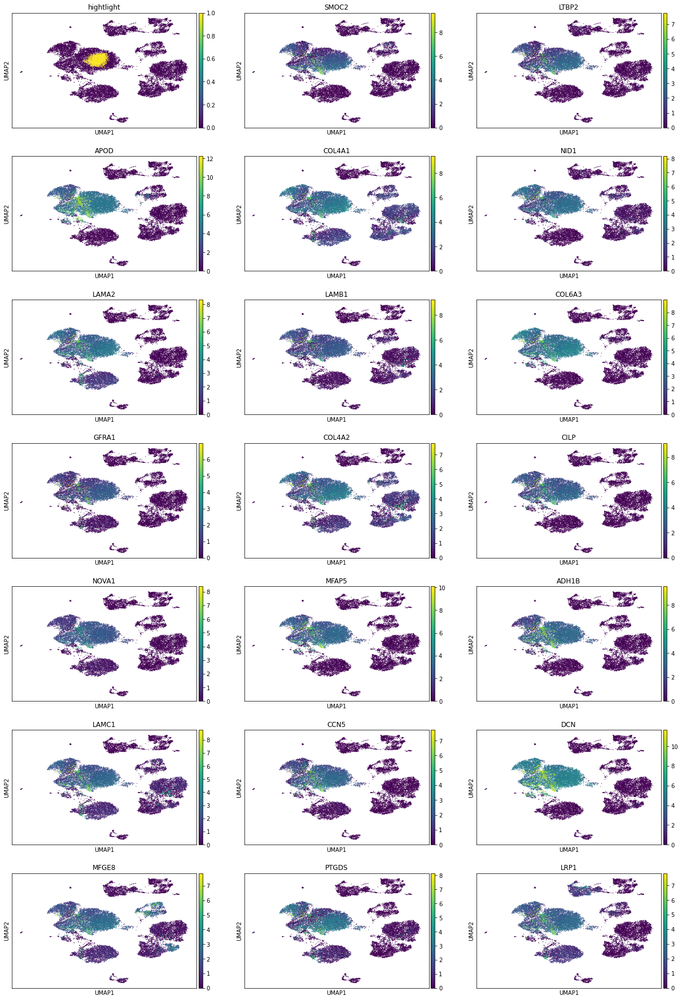

In [24]:
topgenes = list(DE["0"].T[:20].index)
organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == "0"
sc.pl.umap(
    organ_adata,
    color=["hightlight"] + topgenes,
    ncols=3,
)

You can do this for other clusters as well. Here I plot the top 5 genes for all other clusters

0


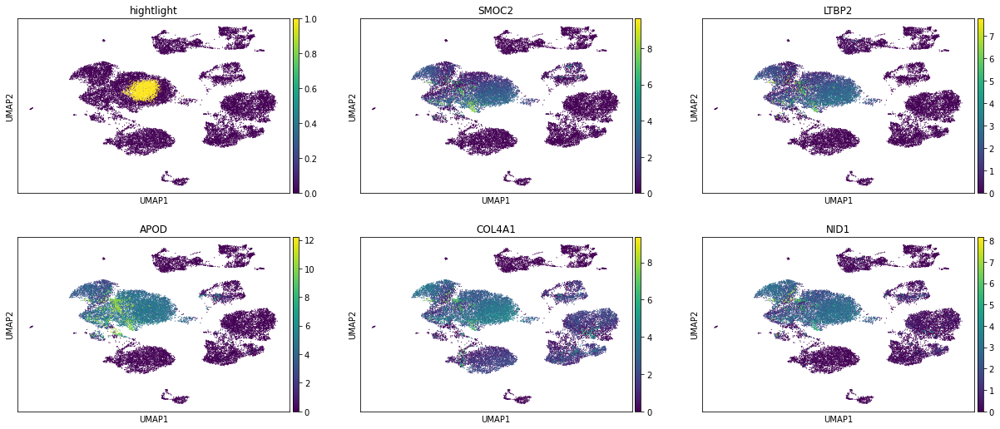

1


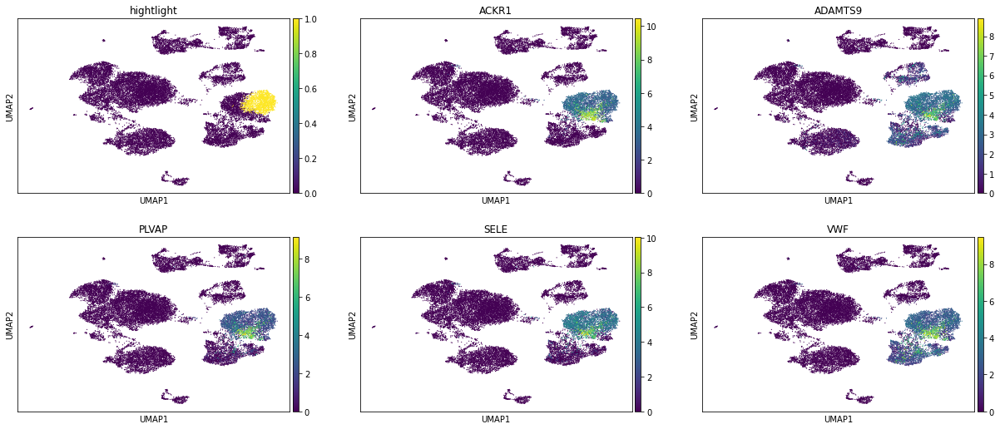

2


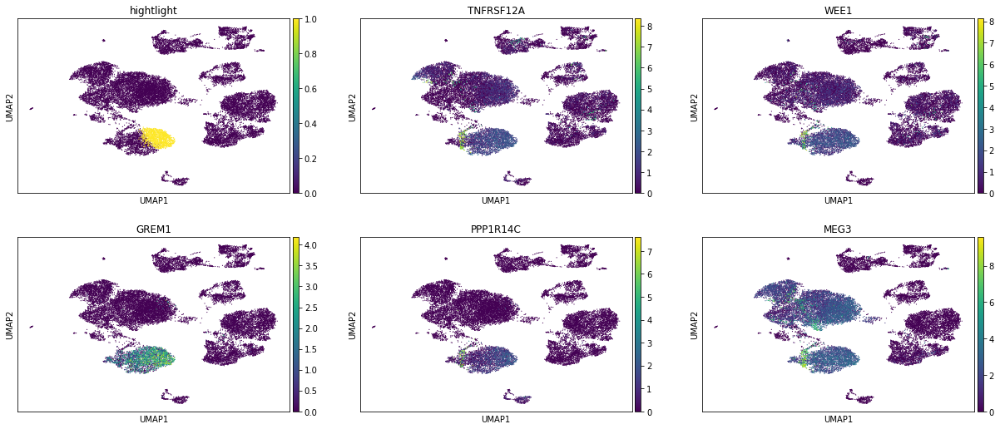

3


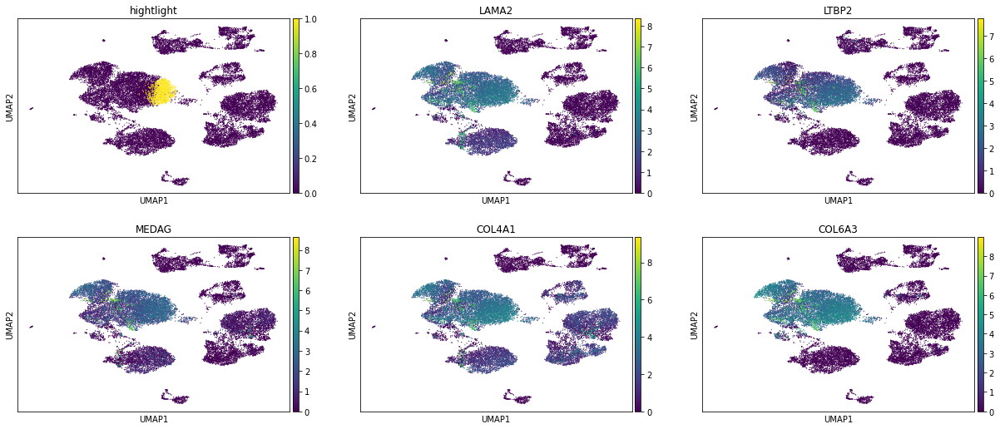

4


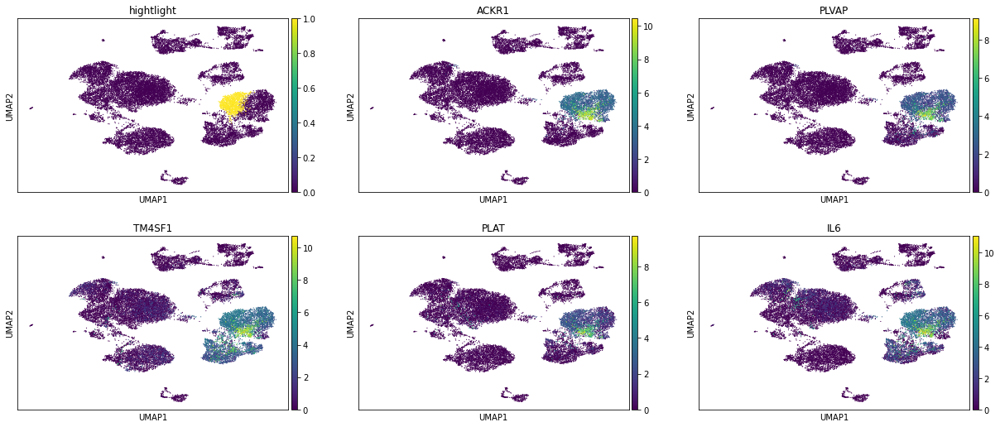

5


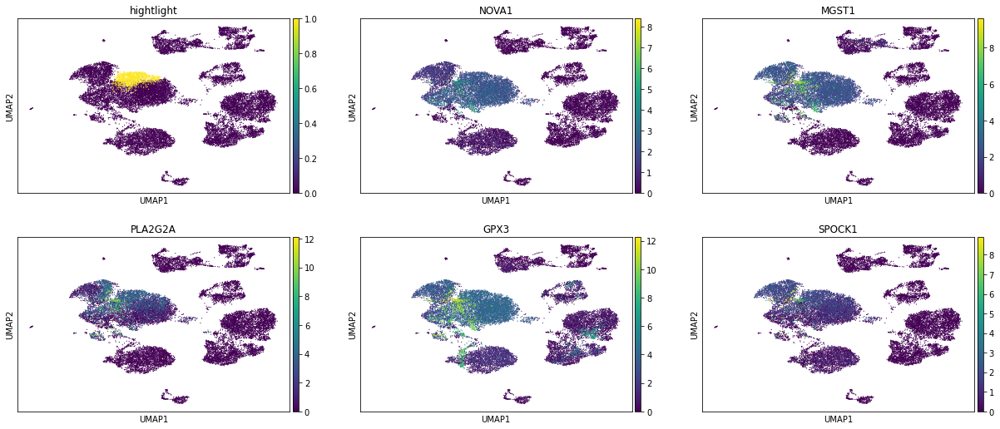

6


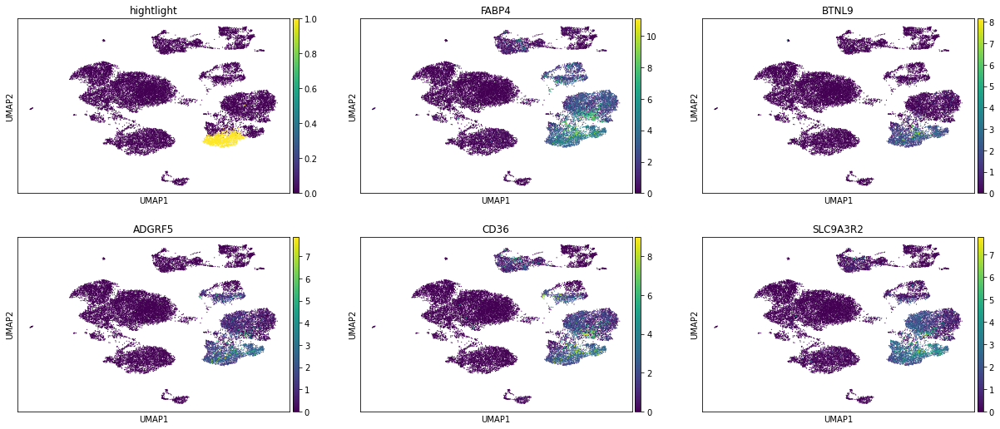

7


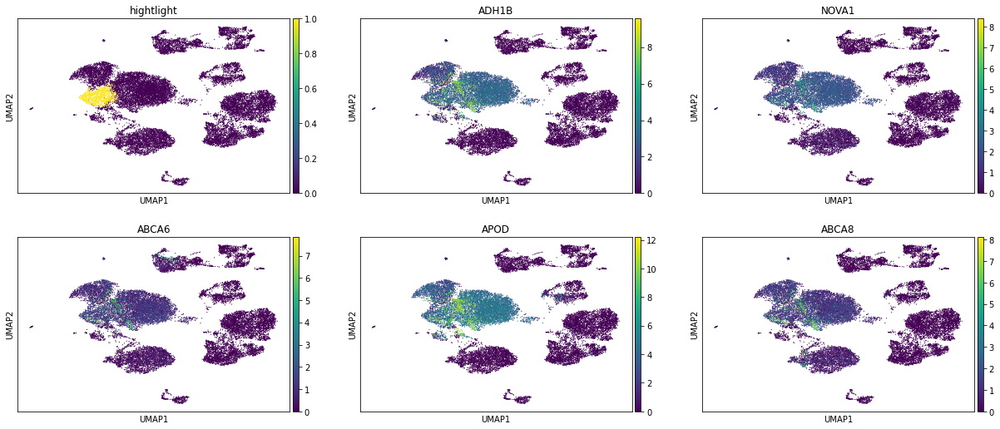

8


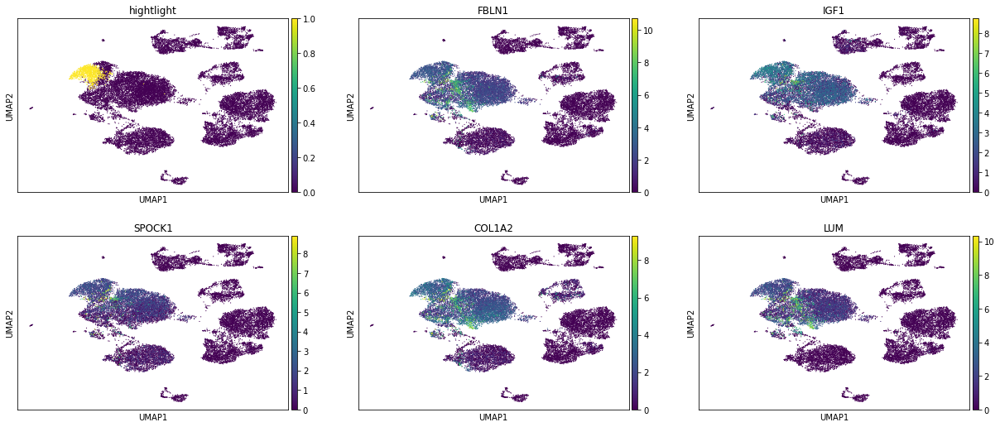

9


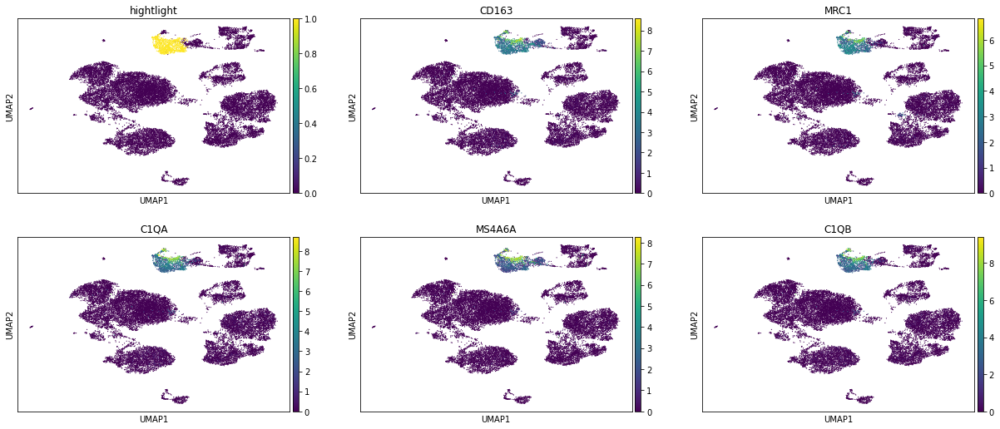

10


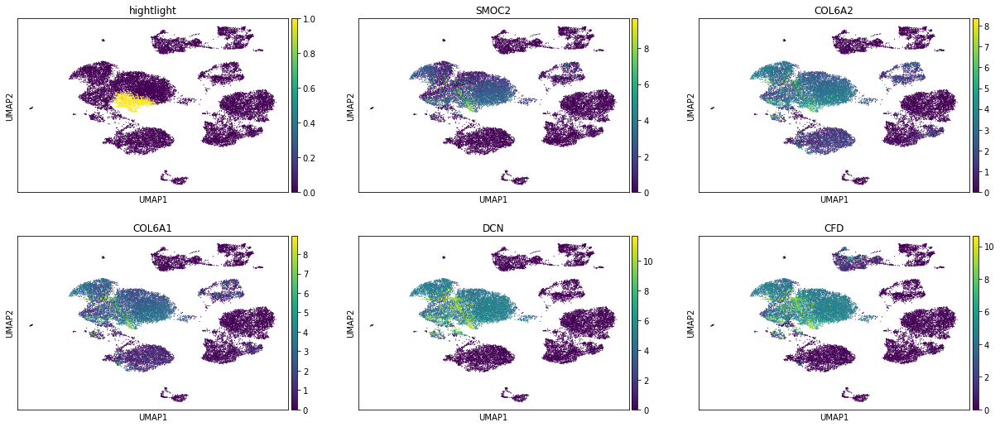

11


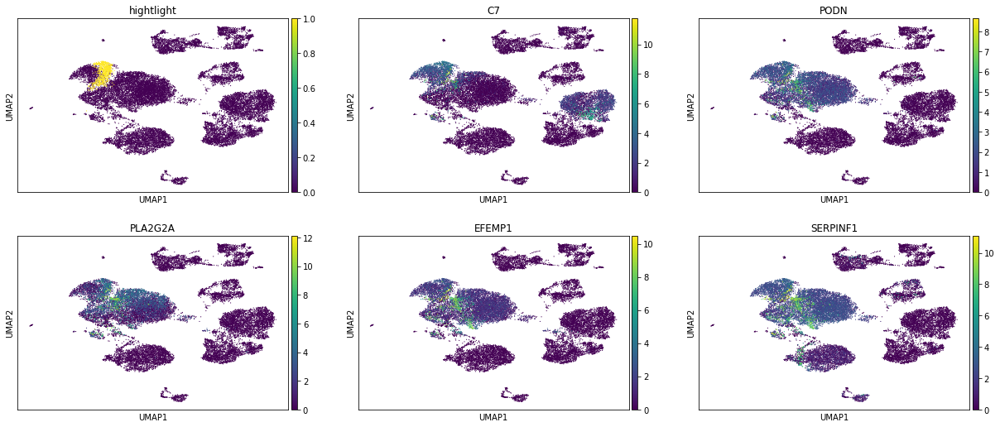

12


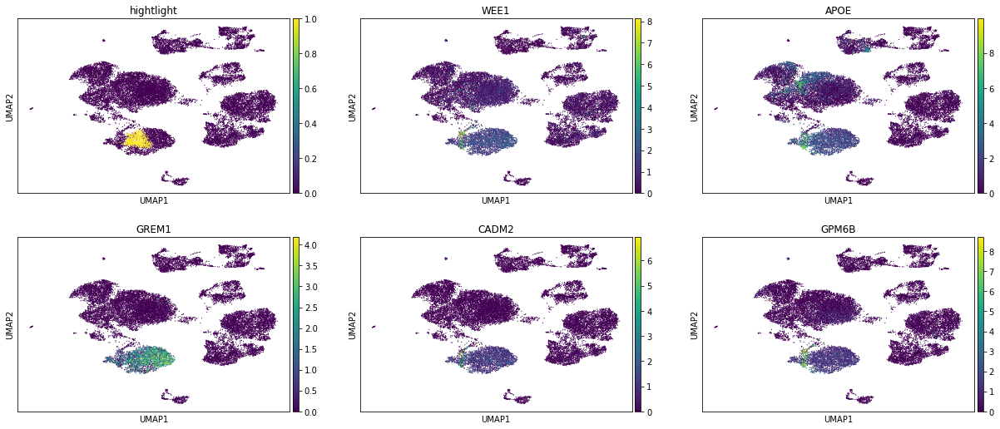

13


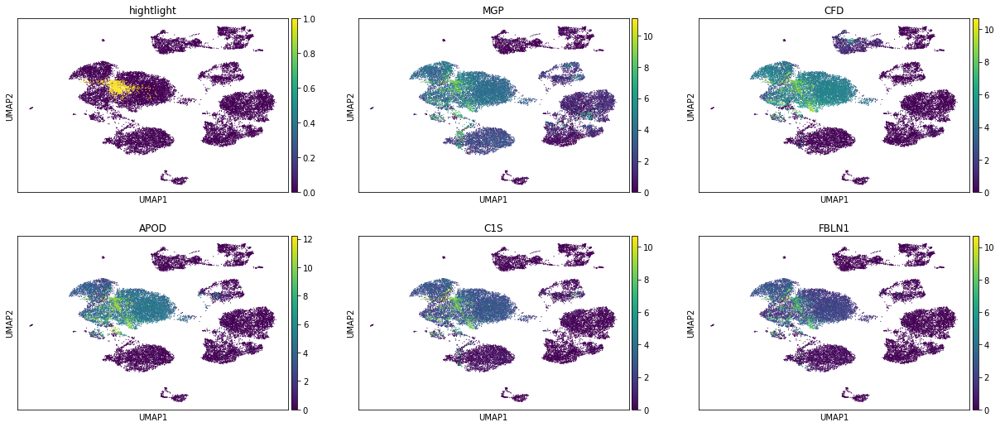

14


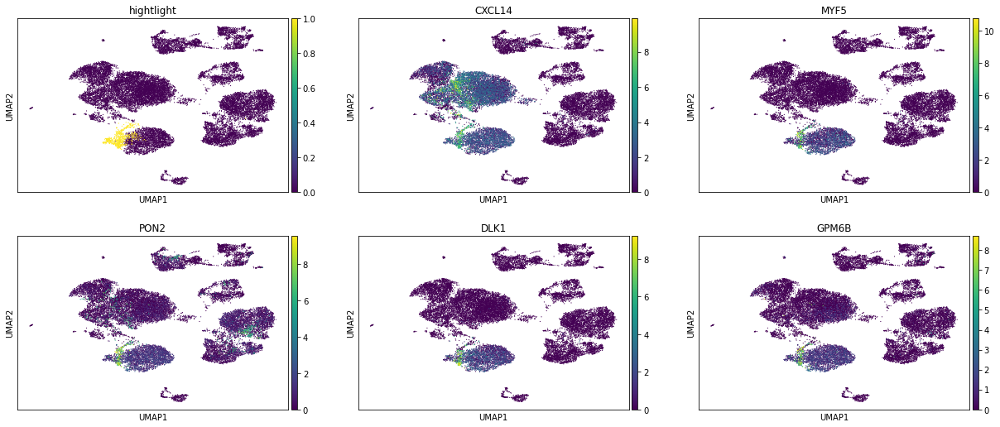

15


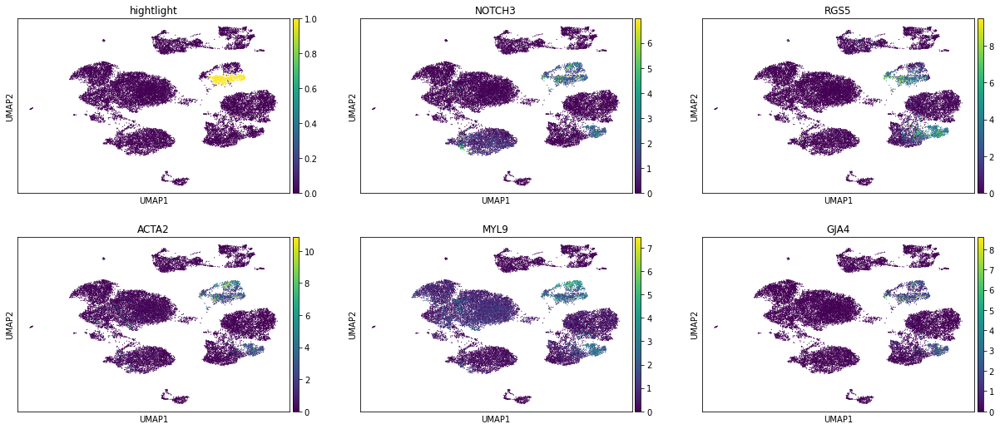

16


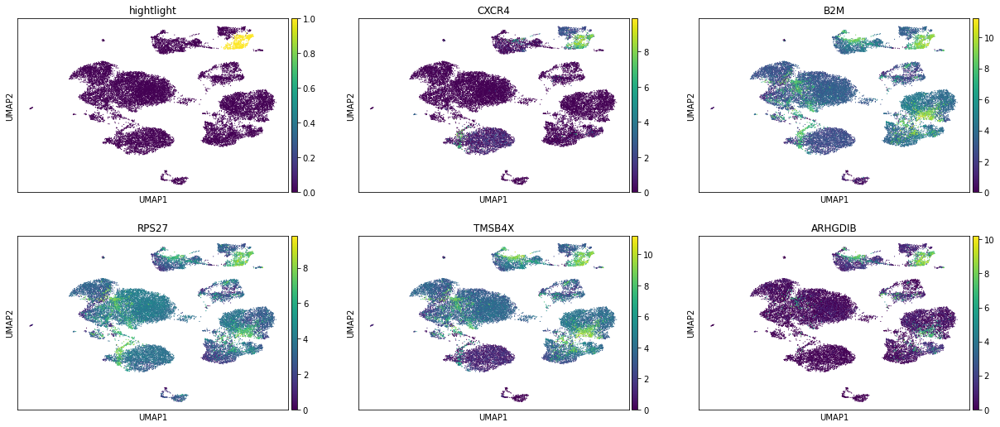

17


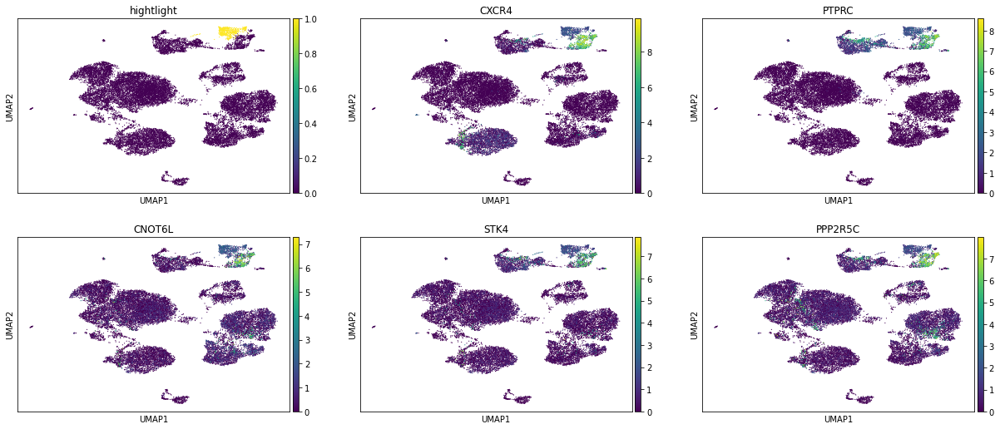

18


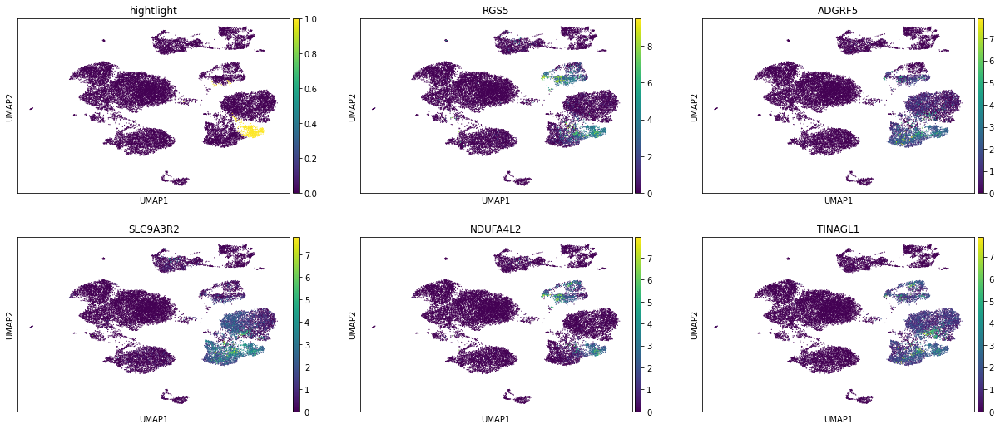

19


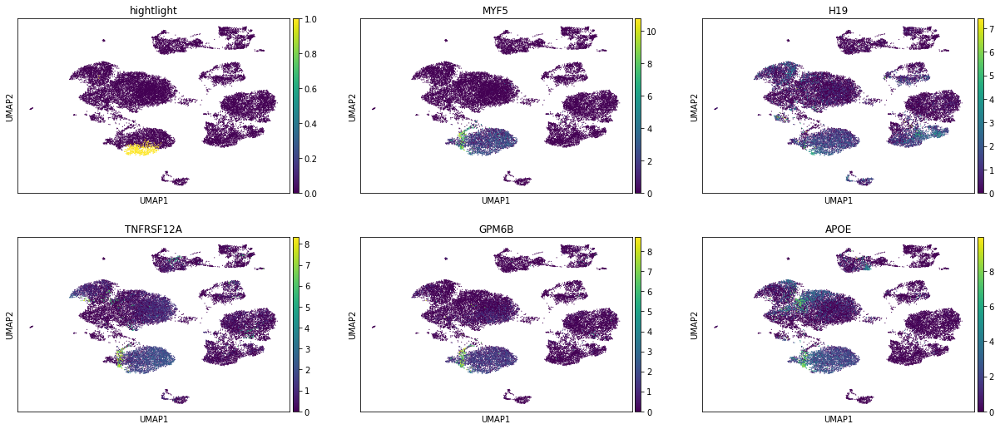

20


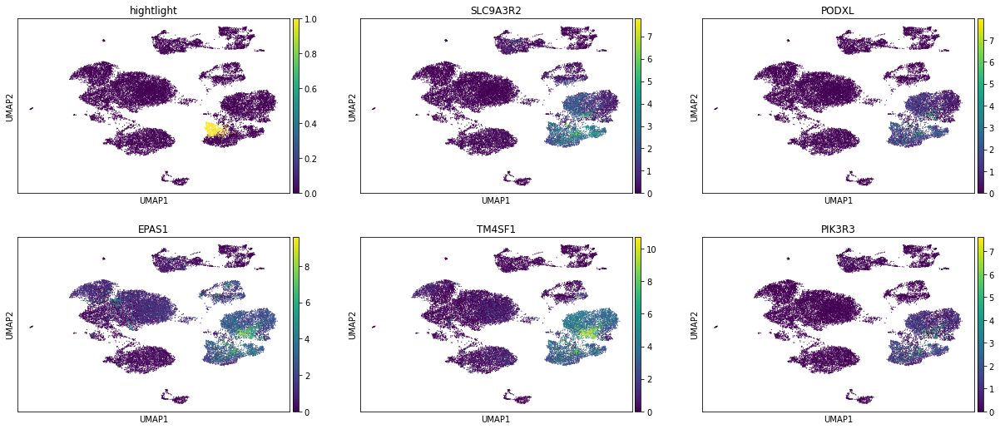

21


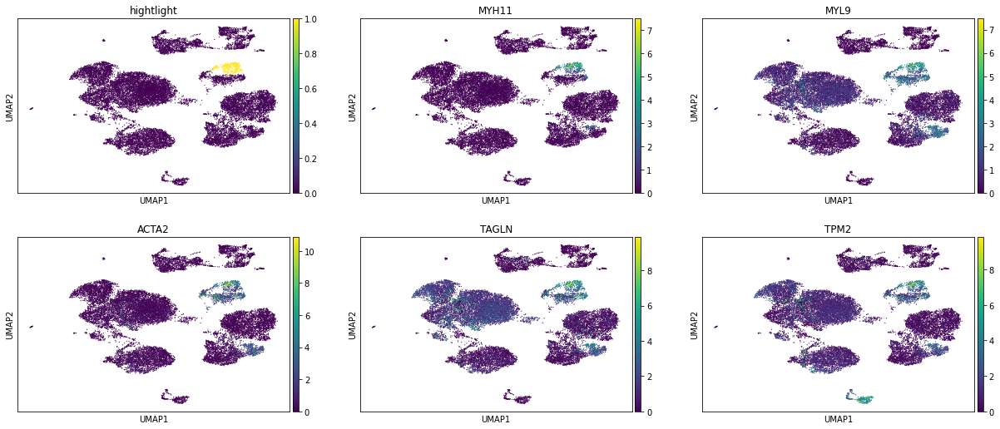

22


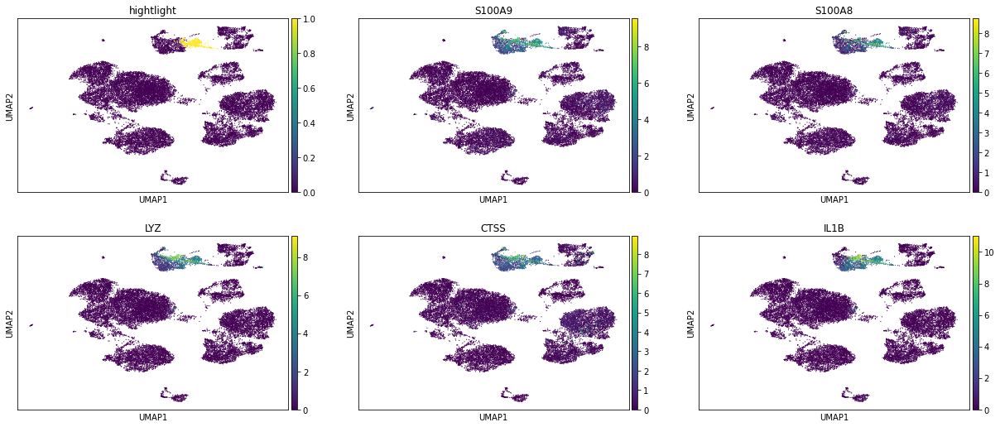

23


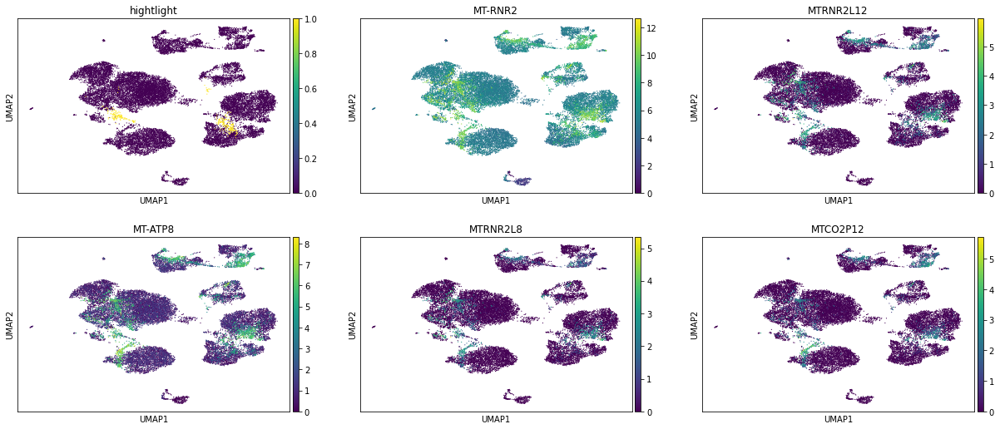

24


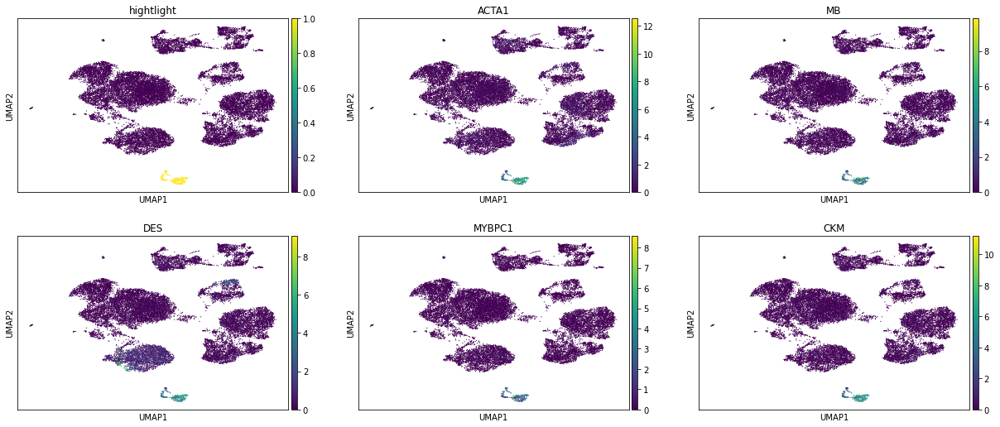

25


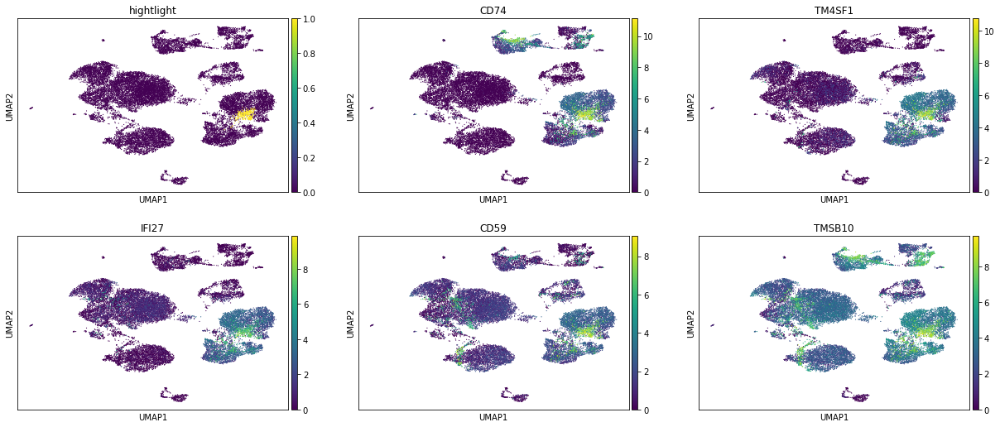

26


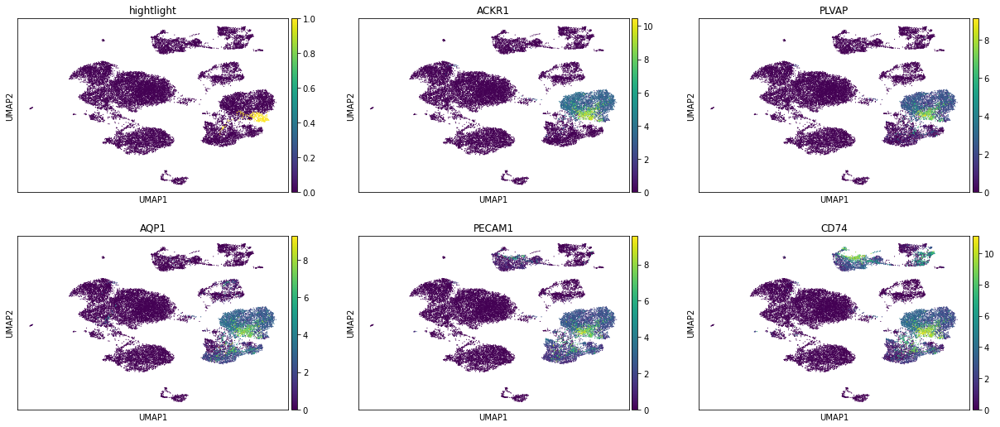

27


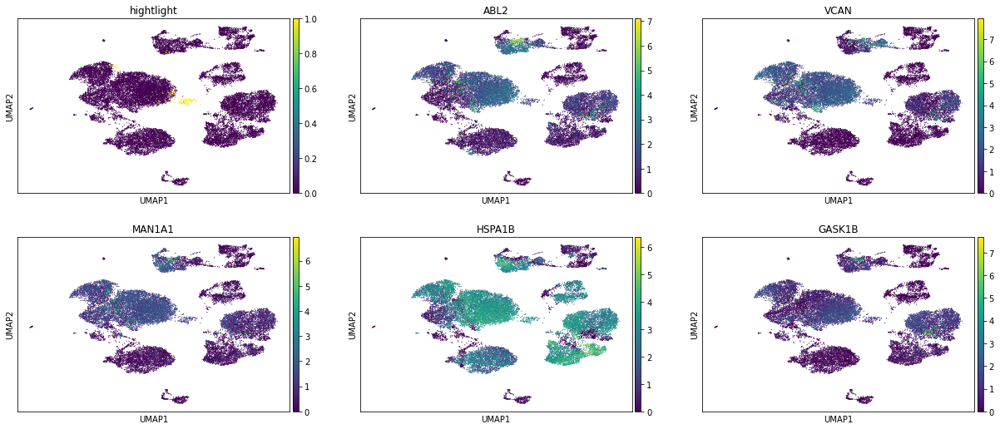

28


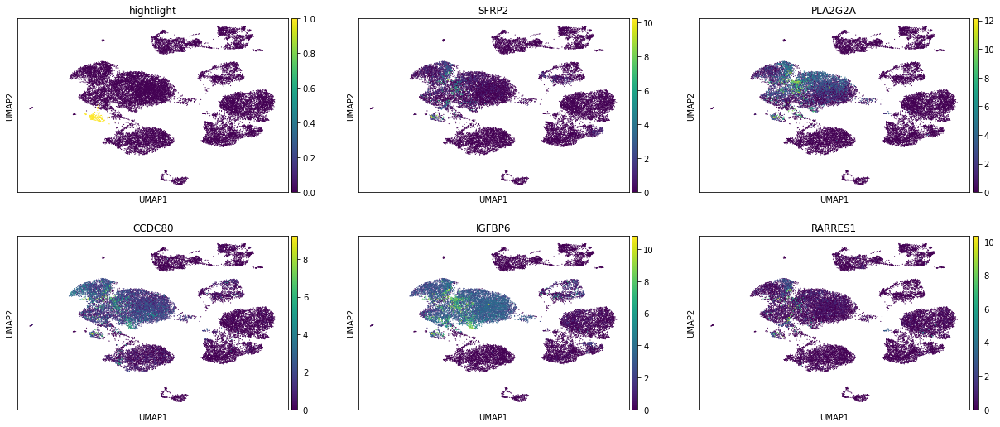

29


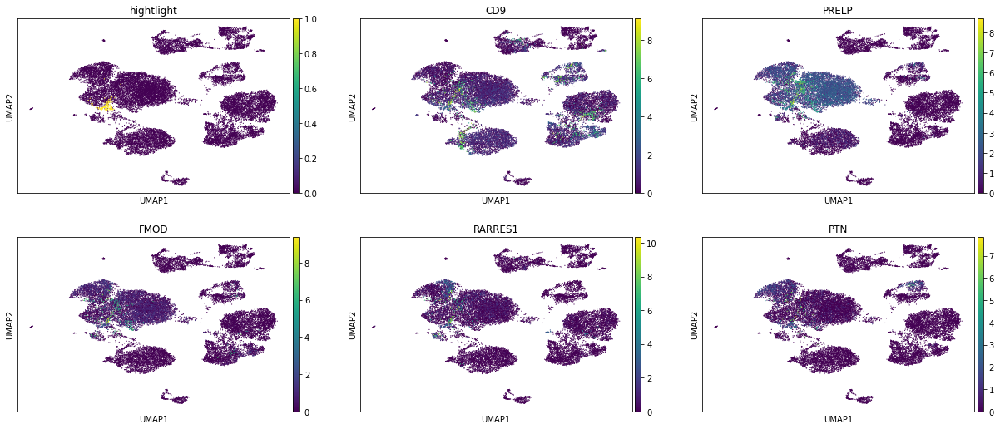

30


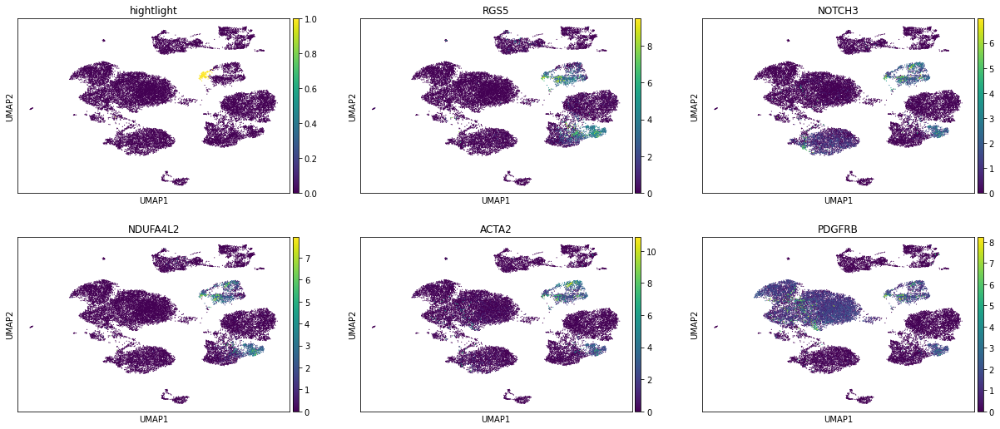

31


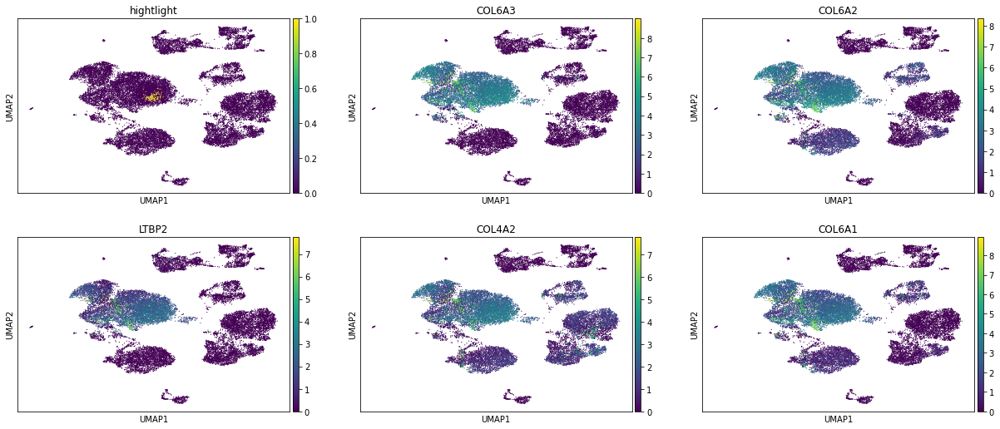

32


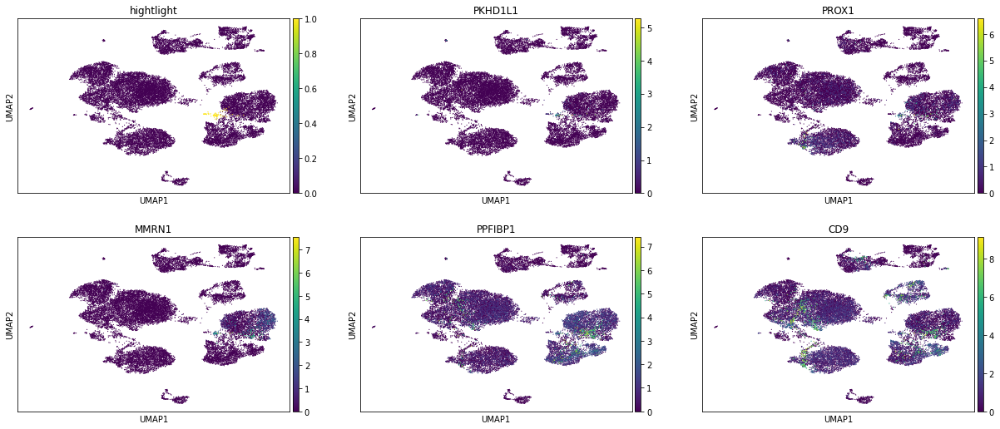

33


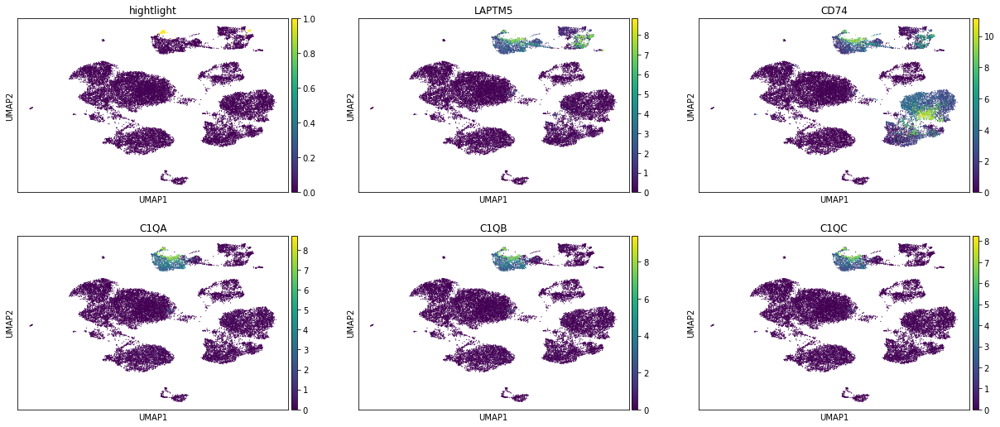

34


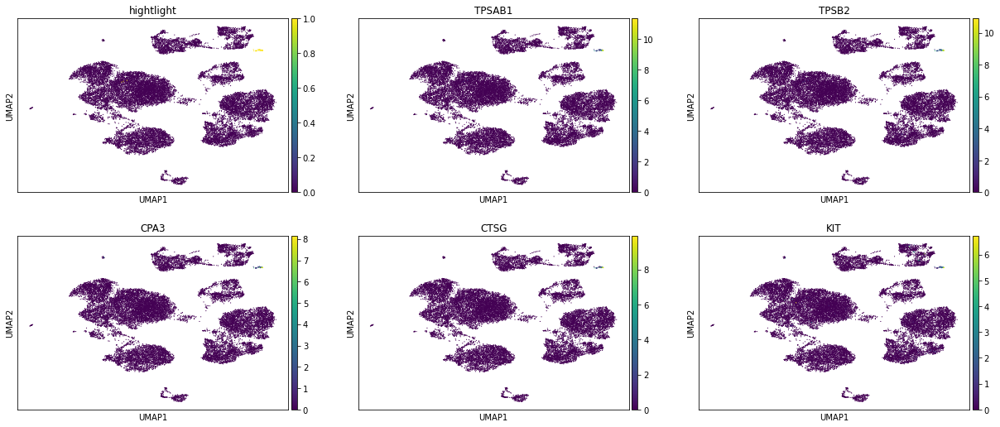

35


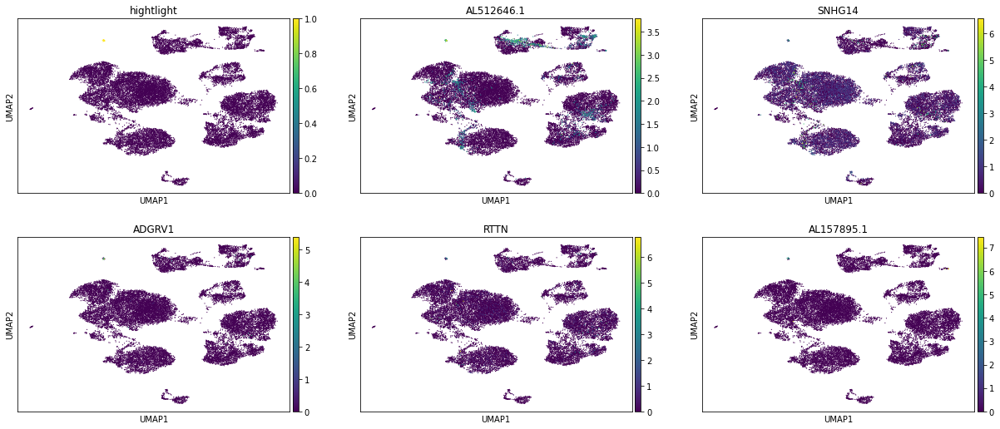

36


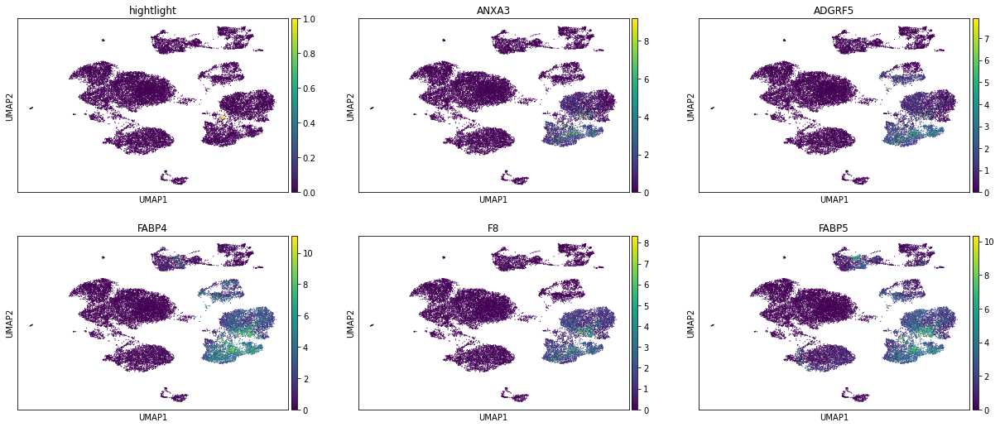

37


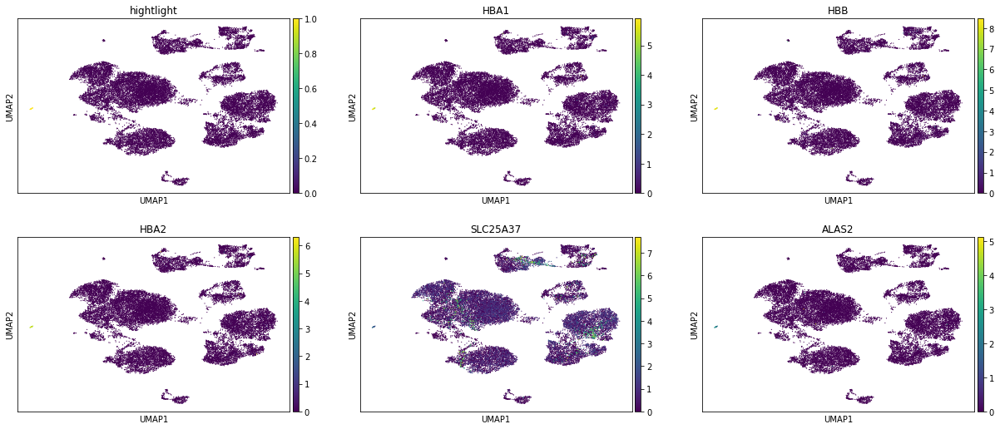

38


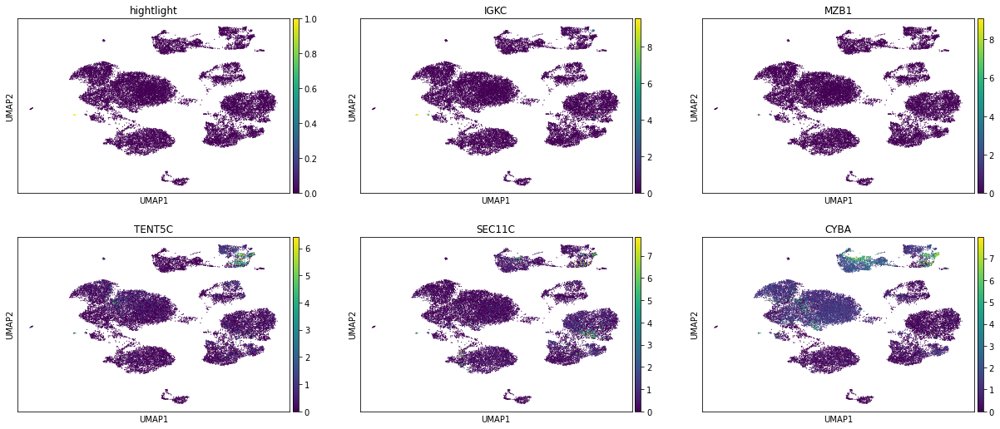

In [25]:
for x in DE.keys():
    print(x)
    topgenes = list(DE[x].T[:5].index)
    organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == x
    sc.pl.umap(
        organ_adata,
        color=["hightlight"] + topgenes,
        ncols=3,
    )

### The extended DE list can be queried by 

In [26]:
DE["0"].T

,wilcoxon_score,log fold change,adjusted pvalue
SMOC2,46.335026,2.893735,0.000000e+00
LTBP2,46.200565,2.803072,0.000000e+00
APOD,45.640312,4.266783,0.000000e+00
COL4A1,45.540333,2.758496,0.000000e+00
NID1,45.539928,2.896186,0.000000e+00
...,...,...,...
FABP4,-21.607609,-10.758816,2.341542e-101
A2M,-21.880331,-10.833832,6.228491e-104
HLA-B,-21.987566,-1.956008,5.978109e-105
FABP5,-23.791248,-30.208635,8.238953e-123


# read in cell ontology 

In [27]:
import obonet

ont_dir = "/data/yosef2/users/chenling/TabulaSapiensData/ontology/"
obo = ont_dir + "cl.obo.txt"
f = open(obo, "r")
co = obonet.read_obo(f)
f.close()

celltype_dict = {}
for x in co.nodes:
    celltype_dict[co.nodes[x]['name']] = x



You can look up all T cell by typing celltype_dict['T'] and using tab complete  

In [28]:
celltype_dict['T cell']

'CL:0000084'

You can also look at the names of all subsets of T cell that contains 'CD4' in their names

In [29]:
import networkx as nx


def PrintChildren(co, parent, pattern=""):
    all_children = [x for x in nx.ancestors(co, celltype_dict[parent])]
    return [co.nodes[x]["name"] for x in all_children if pattern in co.nodes[x]["name"]]


PrintChildren(co, "T cell", "CD4")

['CD4-positive, alpha-beta T cell',
 'CD4-positive, CD25-positive, CCR4-positive, alpha-beta regulatory T cell',
 'CD4-negative, CD8-negative type I NK T cell secreting interleukin-4',
 'CD4-positive type I NK T cell secreting interleukin-4',
 'activated CD4-positive type I NK T cell',
 'CD4-negative, CD8-negative, alpha-beta intraepithelial T cell',
 'CD24-positive, CD4 single-positive thymocyte',
 'effector memory CD4-positive, alpha-beta T cell',
 'CD2-positive, CD5-positive, CD44-positive alpha-beta intraepithelial T cell',
 'CD4-positive, alpha-beta memory T cell',
 'mature CD4 single-positive thymocyte',
 'activated CD4-positive, alpha-beta T cell, human',
 'CD4-positive, alpha-beta intraepithelial T cell',
 'CD4-positive helper T cell',
 'CD4-positive, CXCR3-negative, CCR6-negative, alpha-beta T cell',
 'naive thymus-derived CD4-positive, alpha-beta T cell',
 'CD4-negative, CD8-negative type I NK T cell',
 'CD4-intermediate, CD8-positive double-positive thymocyte',
 'CD4-negativ

# manually create mapping between cluster and cell type (this is just an example), and the relevant marker genes that was used to generate this prediction

In [30]:
organ_adata.obs["annotation_oct2020"] = organ_adata.obs["leiden"].copy()
cluster_mapping = {"0": "T cell"}
cluster_markers = {"0": ["CXCR4", "CD3D", "IL7R", "IL32"]}

This cell will automatically replace the leiden cluster names with cell type annotations

In [31]:
for l in cluster_mapping.keys():
    organ_adata.obs["annotation_oct2020"].replace(l, cluster_mapping[l], inplace=True)
    display(DE[l][cluster_markers[l]])

,CXCR4,CD3D,IL7R,IL32
wilcoxon_score,-9.225533e+00,-1.735454,-3.267248,-7.114798e+00
log fold change,-7.770895e+00,-7.690979,-7.247811,-2.443068e+00
adjusted pvalue,1.017802e-18,0.699169,0.013799,2.962718e-11


# Visualize the results of the manual annotation

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



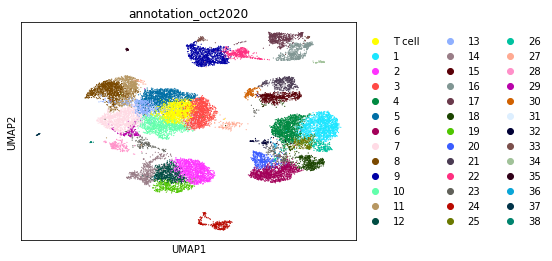

In [32]:
sc.pl.umap(
    organ_adata,
    color=["annotation_oct2020"],
    ncols=3,
)

# manually create mapping between cell type and compartment (this is just an example)

In [33]:
organ_adata.obs["compartment_oct2020"] = organ_adata.obs["annotation_oct2020"].copy()
compartment_mapping = {"T cell": "Immune"}

This cell will automatically replace the leiden cluster names with cell type annotations

In [34]:
for c in compartment_mapping.keys():
    organ_adata.obs["compartment_oct2020"].replace(
        c, compartment_mapping[c], inplace=True
    )

# Visualize the results of the new compartment splitting

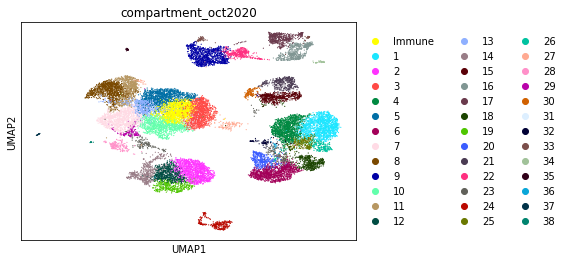

In [35]:
sc.pl.umap(
    organ_adata,
    color=["compartment_oct2020"],
    ncols=3,
)

# save data

In [36]:
organ_adata.write_h5ad(
    data_path + "decontX/organ_data/Pilot1_Pilot2.decontX.%s.h5ad" % organ
)